In [1]:
import sys
import os 
sys.path.append(os.path.abspath(os.path.join("", "..")))
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torch import nn
from vanilla_vae import VanillaVAE
import wandb
device = "cuda:0"

In [9]:
# some flag for training and debugging
normalize_by_10 = True
# run_name = "vanilla-vae-normalizeby10-batchnorm-#1"
run_name = "vanilla-vae-normalizeby10-batchnorm-biggerhidden_dims#1"
args={}
batch_norm = True
args['batch_norm'] = True

vae_save_path = "./outputs/"+run_name+"/"

in_dim = 99648
# latent_dim = 32
# hidden_dims = [1024, 512, 256, 128, 64]
latent_dim = 128
hidden_dims = [4096, 2048, 1024, 512, 256]

vae = VanillaVAE(in_dim, latent_dim, hidden_dims, batch_norm=batch_norm).to(device)
vae.load_state_dict(torch.load(vae_save_path+'vae.pt'))

<All keys matched successfully>

In [10]:
vae.eval()
results = vae.sample(20, device)
if normalize_by_10:
    results = results / 10
torch.save(results, vae_save_path+'vae-samples.pt')

# for building diffusion model 
file_path = '../../w2wfiles/files/'
weight_dimensions = torch.load(file_path+"/weight_dimensions.pt")



In [11]:
results[0]-results[1]

tensor([ 1.2032e-04,  1.8165e-05, -7.5448e-05,  ...,  1.4381e-04,
        -1.7612e-05,  1.3585e-04], device='cuda:0', grad_fn=<SubBackward0>)

In [12]:
# unflatten one weight to normal diffusion model format
from utils import unflatten
unflatten(results[[1]], weight_dimensions, vae_save_path)

In [13]:
from PIL import Image
from lora_w2w import LoRAw2w
from diffusers import DiffusionPipeline 
from peft import PeftModel
from peft.utils.save_and_load import load_peft_weights

pipe = DiffusionPipeline.from_pretrained("stablediffusionapi/realistic-vision-v51", 
                                         torch_dtype=torch.float16,safety_checker = None,
                                         requires_safety_checker = False).to(device)
   
pipe.unet = PeftModel.from_pretrained(pipe.unet, vae_save_path+"/unet", adapter_name="identity1")
adapters_weights1 = load_peft_weights(vae_save_path+"/unet", device="cuda:0")
pipe.unet.load_state_dict(adapters_weights1, strict = False)
pipe.to(device)
print("")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

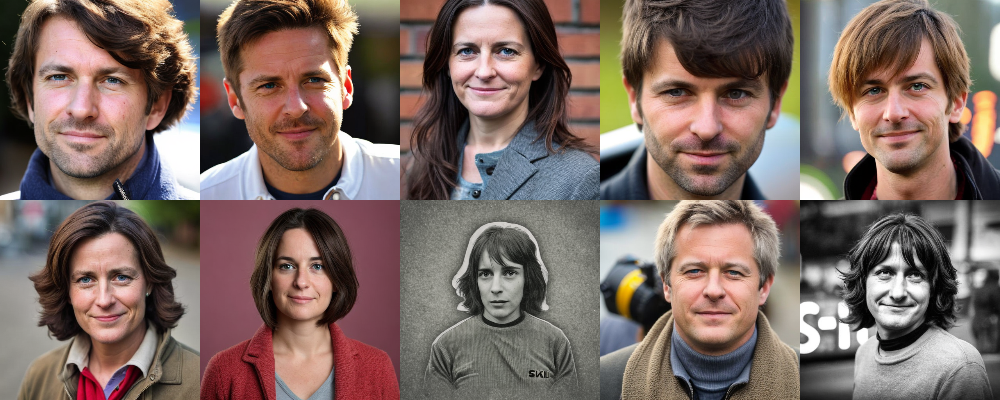

In [14]:
#random seed generator
images = []
for i in range(10):
    generator = torch.Generator(device=device)
    generator = generator.manual_seed(i)
    latents = torch.randn(
            (1, pipe.unet.in_channels, 512 // 8, 512 // 8),
            generator = generator,
            device = device
        ).half()

    #inference parameters
    prompt = "sks person"
    negative_prompt = "low quality, blurry, unfinished"
    guidance_scale = 3.0
    ddim_steps = 50
    #run inference
    image = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
    images.append(image)

### display images
w, h = 512,512
grid = Image.new('RGB', size=(5*512, 2*512))
grid_w, grid_h = grid.size
for i, img in enumerate(images):
    grid.paste(img, box=(i%5*w, i//5*h))
grid

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

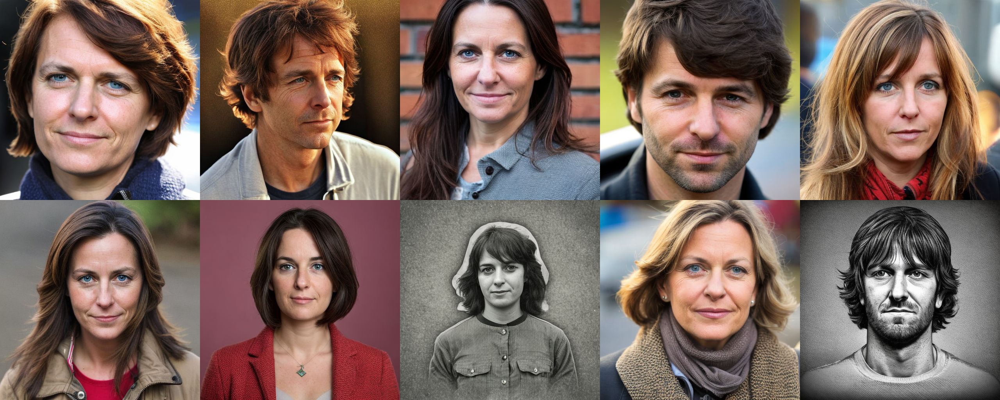

In [6]:
#random seed generator
images = []
for i in range(10):
    generator = torch.Generator(device=device)
    generator = generator.manual_seed(i)
    latents = torch.randn(
            (1, pipe.unet.in_channels, 512 // 8, 512 // 8),
            generator = generator,
            device = device
        ).half()

    #inference parameters
    prompt = "sks person"
    negative_prompt = "low quality, blurry, unfinished"
    guidance_scale = 3.0
    ddim_steps = 50
    #run inference
    image = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
    images.append(image)

### display images
w, h = 512,512
grid = Image.new('RGB', size=(5*512, 2*512))
grid_w, grid_h = grid.size
for i, img in enumerate(images):
    grid.paste(img, box=(i%5*w, i//5*h))
grid